In [ ]:
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)
! pip install torch

! pip install torch-cluster
! pip install torch-geometric
! ls /content/gdrive/MyDrive/Github_Projects/MolecularTransformerEmbeddings -l
KGdb="/content/gdrive/MyDrive/Github_Projects/MolecularTransformerEmbeddings"
%cd /content/gdrive/MyDrive/Github_Projects/MolecularTransformerEmbeddings

Mounted at /content/gdrive
shell-init: error retrieving current directory: getcwd: cannot access parent directories: Transport endpoint is not connected
shell-init: error retrieving current directory: getcwd: cannot access parent directories: Transport endpoint is not connected
Traceback (most recent call last):
  File "/usr/local/bin/pip3", line 5, in <module>
    from pip._internal.cli.main import main
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/main.py", line 10, in <module>
    from pip._internal.cli.autocompletion import autocomplete
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/autocompletion.py", line 10, in <module>
    from pip._internal.cli.main_parser import create_main_parser
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/main_parser.py", line 9, in <module>
    from pip._internal.build_env import get_runnable_pip
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/build_env.py", line 19, in <module>
   

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-2-0efa1f432e77>", line 8, in <cell line: 8>
    get_ipython().run_line_magic('cd', '/content/gdrive/MyDrive/Github_Projects/MolecularTransformerEmbeddings')
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2418, in run_line_magic
    result = fn(*args, **kwargs)
  File "<decorator-gen-85>", line 2, in cd
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/magic.py", line 187, in <lambda>
    call = lambda f, *a, **k: f(*a, **k)
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py", line 342, in cd
    oldcwd = os.getcwd()
OSError: [Errno 107] Transport endpoint is not connected

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib

In [ ]:
import os
import argparse
import time

import os
import time
import torch
import sys
import numpy as np
import itertools
import random

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import Node2Vec

import numpy as np

from transformer import Transformer, create_masks
from load_data import ALPHABET_SIZE, EXTRA_CHARS

import torch
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

In [ ]:
df_ntwk=pd.read_csv('./CTD_chemicals_diseases.csv',comment='#')
df_ntwk

<ipython-input-3-df966b78de68>:1: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  df_ntwk=pd.read_csv('./CTD_chemicals_diseases.csv',comment='#')


,ChemicalName,ChemicalID,CasRN,DiseaseName,DiseaseID,DirectEvidence,InferenceGeneSymbol,InferenceScore,OmimIDs,PubMedIDs
0,06-Paris-LA-66 protocol,C046983,NaN,Precursor Cell Lymphoblastic Leukemia-Lymphoma,MESH:D054198,therapeutic,NaN,NaN,NaN,4519131
1,10074-G5,C534883,NaN,Adenocarcinoma,MESH:D000230,NaN,MYC,4.07,NaN,26432044
2,10074-G5,C534883,NaN,Adenocarcinoma of Lung,MESH:D000077192,NaN,MYC,4.30,NaN,26656844|27602772
3,10074-G5,C534883,NaN,Alopecia,MESH:D000505,NaN,AR,4.49,NaN,15902657
4,10074-G5,C534883,NaN,Androgen-Insensitivity Syndrome,MESH:D013734,NaN,AR,6.86,300068|312300,1303262|8281139
...,...,...,...,...,...,...,...,...,...,...
8787886,zymosterol,C015582,128-33-6,"Bone Diseases, Metabolic",MESH:D001851,NaN,CYP27A1,5.94,NaN,24381012
8787887,zymosterol,C015582,128-33-6,Cholestasis,MESH:D002779,NaN,CYP27A1,4.84,NaN,15795599
8787888,zymosterol,C015582,128-33-6,Liver Cirrhosis,MESH:D008103,NaN,CYP27A1,4.90,NaN,24381012
8787889,zymosterol,C015582,128-33-6,"MICROCEPHALY, CONGENITAL CATARACT, AND PSORIAS...",OMIM:616834,NaN,MSMO1,7.80,616834.0,NaN


In [ ]:
entities=list(set(list(df_ntwk['ChemicalName'])+list(df_ntwk['DiseaseName'])))
ent_dict={}
ent_dict_r={}
for i, ent in enumerate(entities):
    ent_dict[ent]=i
    ent_dict_r[i]=ent

In [ ]:
chems_set=set(df_ntwk['ChemicalName'])
diseases_set=set(df_ntwk['DiseaseName'])

entity_type={}
for i in range(len(ent_dict)):
    if entities[i] in chems_set:
        entity_type[i]=1
    else:
        entity_type[i]=0

In [ ]:
for i in tqdm(range(2000)):
    time.sleep(10)

100%|██████████| 2000/2000 [5:33:41<00:00, 10.01s/it]


In [ ]:
edges=[]
for i, row in df_ntwk.iterrows():
    edges.append([ent_dict[row['ChemicalName']],ent_dict[row['DiseaseName']]])
edges_index=torch.tensor(edges,dtype=torch.long)
data=Data(edge_index=edges_index.t().contiguous())

In [ ]:
model = Node2Vec(data.edge_index, embedding_dim=30, walk_length=10,
                 context_size=5, walks_per_node=2, num_negative_samples=1,
                 p=1, q=1, sparse=True).to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
model.train()

ImportError: 'Node2Vec' requires either the 'pyg-lib' or 'torch-cluster' package

In [ ]:
name=[]
embedding_l=[]
for i in range(data.num_nodes):
    name.append(ent_dict_r[i])
    embedding_l.append(model(torch.tensor([i])).cpu().detach().numpy())
pd.DataFrame({'name':name,'embedding':embedding_l}).to_csv('graph_embedding.csv',index=False)

In [ ]:
embedding = model(torch.arange(data.num_nodes)).cpu().detach().numpy()
print(embedding)
np.save('embedding.npy', embedding)

[[-0.27815926 -0.76935166  1.2917991  ...  0.03936711  0.99902815
   0.9887645 ]
 [-0.514309    0.21454477 -0.12399638 ...  0.13874981  0.9855082
   0.1313233 ]
 [ 1.3956904   0.60209155 -1.5659617  ...  0.27466246 -1.1110488
   0.7281457 ]
 ...
 [ 1.1499813  -0.43696576 -0.6831298  ... -2.1104865  -1.151454
  -0.31073382]
 [ 0.61061424 -0.855977    0.5767768  ...  0.33808735 -0.5490476
   1.2581757 ]
 [ 1.026203   -0.39992738 -0.18100198 ...  0.4088998   0.09076964
  -1.5101906 ]]


In [ ]:
%%time
node_embeddings = embedding
random.seed(42)

# Generating positive and negative samples for link prediction
g_edges = [(x[0],x[1]) for x in edges]
positive_samples = random.sample(g_edges, 2000)

random.seed(10)
x_a=random.sample(range(data.num_nodes),100)
random.seed(12)
x_b=random.sample(range(data.num_nodes),100)

negative_samples = [(i, j) for i in x_a for j in x_b if i != j]
negative_samples = random.sample(negative_samples, 4000)
negative_samples = [(i, j) for i, j in tqdm(negative_samples) if (i, j) not in g_edges]


/usr/local/lib/python3.10/dist-packages/torch_geometric/data/storage.py:450: UserWarning: Unable to accurately infer 'num_nodes' from the attribute set '{'edge_index'}'. Please explicitly set 'num_nodes' as an attribute of 'data' to suppress this warning
  warnings.warn(
100%|██████████| 4000/4000 [10:30<00:00,  6.34it/s]

CPU times: user 10min 33s, sys: 3.76 s, total: 10min 37s
Wall time: 10min 32s


In [ ]:
pd.DataFrame({
    "label": [1] * len(positive_samples) + [0] * len(negative_samples),
    "data":positive_samples+negative_samples
}).to_csv('selected_samples_s.csv',index=False)

In [ ]:
features = np.array([list(node_embeddings[x[0]])+list(node_embeddings[x[1]]) for x in positive_samples + negative_samples])
labels=np.array([1]*len(positive_samples)+[0]*len(negative_samples)).reshape(-1,1)

features_train, features_test, labels_train, labels_test = train_test_split(features, labels, test_size=0.2, random_state=42, stratify=labels)

In [ ]:
model_pipeline = make_pipeline(StandardScaler(), SVC(probability=True))
model_pipeline.fit(features_train, labels_train)

# Making predictions on the test set
predictions = model_pipeline.predict(features_test)
predictions_prob = model_pipeline.predict_proba(features_test)[:, 1]

# Evaluating the model
accuracy = accuracy_score(labels_test, predictions)
roc_auc = roc_auc_score(labels_test, predictions_prob)

print(f"Accuracy: {accuracy}")
print(f"ROC AUC: {roc_auc}")


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.9816360601001669
ROC AUC: 0.9973245614035088


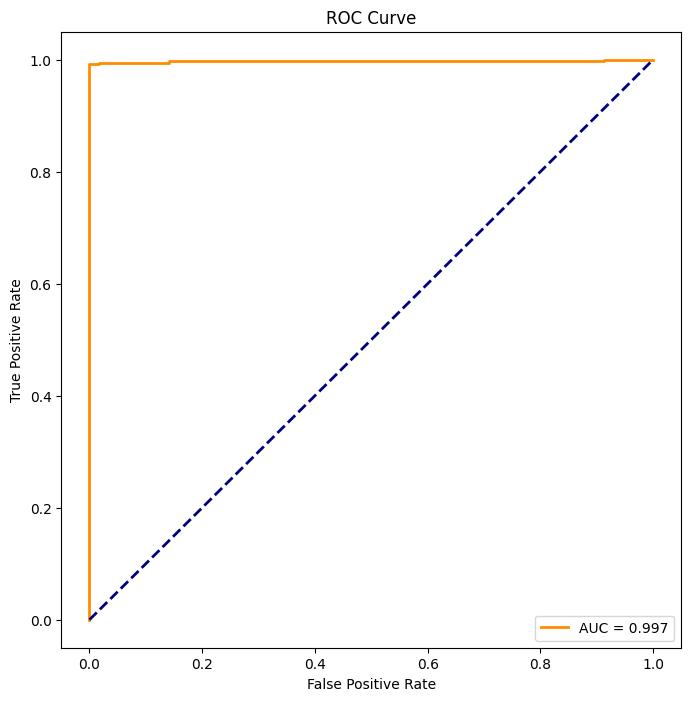

In [ ]:
# 计算ROC曲线的参数
fpr, tpr, thresholds = roc_curve(labels_test, predictions_prob)

# 计算AUC值
roc_auc = auc(fpr, tpr)

# 绘制ROC曲线
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.3f}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:


# Assuming 'model' is your trained Node2Vec model and 'graph' is your networkx graph

# Extracting node embeddings from the model
node_embeddings = embedding

# Generating positive and negative samples for link prediction
g_edges = [(x[0],x[1]) for x in edges]
positive_samples = g_edges
negative_samples = [(i, j) for i in range(len(data.num_nodes)) for j in range(len(data.num_nodes)) if (i, j) not in g_edges and i != j]

# Creating labels for positive and negative samples
labels = [1] * len(positive_samples) + [0] * len(negative_samples)

# Concatenating positive and negative samples
all_samples = positive_samples + negative_samples

# Creating features for the samples based on node embeddings
features = torch.cat([node_embeddings[torch.tensor([i, j])] for i, j in all_samples], dim=1)

# Splitting data into train and test sets
features_train, features_test, labels_train, labels_test = train_test_split(features.numpy(), labels, test_size=0.04, random_state=42)

# Training a support vector classifier (SVC)
model_pipeline = make_pipeline(StandardScaler(), SVC(probability=True))
model_pipeline.fit(features_train, labels_train)

# Making predictions on the test set
predictions = model_pipeline.predict(features_test)

# Evaluating the model
accuracy = accuracy_score(labels_test, predictions)
roc_auc = roc_auc_score(labels_test, model_pipeline.predict_proba(features_test)[:, 1])

print(f"Accuracy: {accuracy}")
print(f"ROC AUC: {roc_auc}")


In [ ]:
smiles_strings = list(pd.read_csv("Chem_id.csv")['smiles'])
len(smiles_strings)

7776

In [ ]:
sys.path.insert(1, './')
from transformer import Transformer, create_masks
from load_data import ALPHABET_SIZE, EXTRA_CHARS
checkpoint_dir = "./checkpoints/"

MAX_LEN = 256
MODEL_DIM = 512
N_LAYERS = 6

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(DEVICE)
TRANSFORMER_DEVICE = DEVICE
PRINTABLE_ASCII_CHARS = 95
_extra_chars = ["seq_start", "seq_end", "pad"]
EXTRA_CHARS = {key: chr(PRINTABLE_ASCII_CHARS + i) for i, key in enumerate(_extra_chars)}
ALPHABET_SIZE = PRINTABLE_ASCII_CHARS + len(EXTRA_CHARS)

def find_ckpts(*args, **kwargs):
    ckpts = os.listdir(checkpoint_dir)
    str_args = [str(x) for x in itertools.chain(args, kwargs.values())]
    return [checkpoint_dir + ckpt for ckpt in ckpts if
            all([arg in ckpt.replace(".", "_").split("_") for arg in str_args])]
def encode_char(c):
    return ord(c) - 32


def decode_char(n):
    return chr(n + 32)


def encode_smiles(string, start_char=EXTRA_CHARS['seq_start']):
    return torch.tensor([ord(start_char)] + [encode_char(c) for c in string])


def pad_tensors(tensors, pad_char=chr(0), max_len=None):
    if not max_len:
        max_len = max([t.shape[0] for t in tensors]) + 1

    padded_tensors = torch.full((len(tensors), max_len), ord(pad_char), dtype=torch.long)
    for i, tensor in enumerate(tensors):
        padded_tensors[i, 0:tensor.shape[0]] = tensor

    return padded_tensors

# Load the pretrained model

found = find_ckpts()
load_path = found[0] if len(found) > 0 else ""

model = Transformer(ALPHABET_SIZE, MODEL_DIM, N_LAYERS)
model = nn.DataParallel(model)
model = model.to(TRANSFORMER_DEVICE)

checkpoint = torch.load(load_path, map_location=DEVICE)
model.load_state_dict(checkpoint['state_dict'])
model = model.eval()

cuda:0


In [ ]:
len(smiles_strings)

7776

In [ ]:
#
smile_embd={}

with torch.no_grad():
    for sm in smiles_strings:
        encoded = encode_smiles(sm, start_char=EXTRA_CHARS['seq_start']).unsqueeze(0).to(TRANSFORMER_DEVICE)
        encoded = encoded[:, :MAX_LEN]
        mask = create_masks(encoded)
        embedding = model.module.encoder(encoded, mask)[0].cpu().numpy()
        flattened = embedding.mean(axis=0).astype(float)
        smile_embd[sm]=list(flattened)
        #print(sm, flattened.shape)

In [ ]:
df=pd.read_csv("Chem_id.csv")
df

,iupac,smiles
0,"1,2,3,4,5,6-hexachloronaphthalene",Clc1ccc2c(Cl)c(Cl)c(Cl)c(Cl)c2c1Cl
1,"1,2,3,4,6,7,8-heptachlorodibenzodioxin",Clc1cc2Oc3c(Cl)c(Cl)c(Cl)c(Cl)c3Oc2c(Cl)c1Cl
2,"1,2,3,4,6,7,8-heptachlorodibenzofuran",Clc1cc2c(oc3c(Cl)c(Cl)c(Cl)c(Cl)c23)c(Cl)c1Cl
3,"1,2,3,4,7,8-hexachlorodibenzodioxin",Clc1cc2Oc3c(Cl)c(Cl)c(Cl)c(Cl)c3Oc2cc1Cl
4,"1,2,3,4,7,8-hexachlorodibenzofuran",Clc1cc2oc3c(Cl)c(Cl)c(Cl)c(Cl)c3c2cc1Cl
...,...,...
7771,benziodarone,CCc1oc2ccccc2c1C(=O)c3cc(I)c(O)c(I)c3
7772,Thymidine Monophosphate,CC1=CN([C@H]2C[C@H](O)[C@@H](CO[P](O)(O)=O)O2)...
7773,tricaine,CCOC(=O)c1cccc(N)c1.C[S](O)(=O)=O
7774,isobutyl-4-hydroxybenzoate,CC(C)COC(=O)c1ccc(O)cc1


In [ ]:
embds=[]
for idx, row in df.iterrows():
    embds.append(smile_embd[row['smiles']])

df['embd']=embds
df.to_csv('./Chem_sm_embd.csv', index=False)

In [ ]:
df

,iupac,smiles,embd
0,"1,2,3,4,5,6-hexachloronaphthalene",Clc1ccc2c(Cl)c(Cl)c(Cl)c(Cl)c2c1Cl,"[-0.7791614532470703, -0.1504734307527542, 0.4..."
1,"1,2,3,4,6,7,8-heptachlorodibenzodioxin",Clc1cc2Oc3c(Cl)c(Cl)c(Cl)c(Cl)c3Oc2c(Cl)c1Cl,"[-0.722934901714325, -0.11570950597524643, 0.4..."
2,"1,2,3,4,6,7,8-heptachlorodibenzofuran",Clc1cc2c(oc3c(Cl)c(Cl)c(Cl)c(Cl)c23)c(Cl)c1Cl,"[-0.7810975909233093, -0.18828339874744415, 0...."
3,"1,2,3,4,7,8-hexachlorodibenzodioxin",Clc1cc2Oc3c(Cl)c(Cl)c(Cl)c(Cl)c3Oc2cc1Cl,"[-0.8246630430221558, -0.10623586177825928, 0...."
4,"1,2,3,4,7,8-hexachlorodibenzofuran",Clc1cc2oc3c(Cl)c(Cl)c(Cl)c(Cl)c3c2cc1Cl,"[-0.9444597363471985, -0.20538794994354248, 0...."
...,...,...,...
7771,benziodarone,CCc1oc2ccccc2c1C(=O)c3cc(I)c(O)c(I)c3,"[-1.0309861898422241, -0.14050230383872986, 0...."
7772,Thymidine Monophosphate,CC1=CN([C@H]2C[C@H](O)[C@@H](CO[P](O)(O)=O)O2)...,"[-0.11226566135883331, 0.4062413275241852, 0.4..."
7773,tricaine,CCOC(=O)c1cccc(N)c1.C[S](O)(=O)=O,"[-0.20573690533638, -0.08478722721338272, 0.14..."
7774,isobutyl-4-hydroxybenzoate,CC(C)COC(=O)c1ccc(O)cc1,"[-0.9672043919563293, -0.18739138543605804, 0...."


In [ ]:
y_s=[]

for sm in smiles_strings:
    y_s.append(smile_embd[sm])

df_y=pd.DataFrame({

    'smiles':smiles_strings,
    'embd':y_s
})

df_y.to_csv('./Chem_sm_embd.csv')

In [ ]:
! pip install openai

from openai import OpenAI
from google.colab import userdata
client = OpenAI(
    api_key=userdata.get('OPENAI_API_KEY')
)

def get_embedding(text, model="text-embedding-3-small"):
   text = text.replace("\n", " ")
   return client.embeddings.create(input = [text], model=model, dimensions=256).data[0].embedding


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.4/227.4 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.8/77.8 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.7 MB/s eta 0:00:00


In [ ]:
df_pmid=pd.read_csv("./Pmid_e.csv")
print(len(df_pmid))
df_pmid.head()

9289


,pmid,year,abstract_text
0,706,1976,Thirteen out of 18 young out-patients with sim...
1,1803,1976,Mice were given a drug per os and 2 h later we...
2,1959,1976,"In a double-blind trial lasting 2 weeks, a new..."
3,2004,1976,Eight patients had cardiac manifestations that...
4,2127,1976,Beta-Adrenergic stimulation with isoproterenol...


In [ ]:
%%time
embeddings=[]
for i in tqdm(df_pmid.abstract_text):

  embeddings.append(get_embedding(i, model='text-embedding-3-large'))
df_pmid['ada_embedding']=embeddings
df_pmid.to_csv('./embedded_Pmid_e.csv', index=False)

In [ ]:
def normalize_l2(x):
    x = np.array(x)
    if x.ndim == 1:
        norm = np.linalg.norm(x)
        if norm == 0:
            return x
        return x / norm
    else:
        norm = np.linalg.norm(x, 2, axis=1, keepdims=True)
        return np.where(norm == 0, x, x / norm)


In [ ]:
embeddings_cut=[]
for i in tqdm(embeddings):
  embeddings_cut.append(normalize_l2(i[:256]))

In [ ]:
df_pmid.to_csv('./embedded_Pmid_e.csv', index=False)

In [ ]:
from transformers import AutoTokenizer, AutoModel
import nltk, re, itertools
import numpy as np
import torch
from tqdm import tqdm

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
#DEVICE = "cpu"
tokenizer = AutoTokenizer.from_pretrained('allenai/specter')
model = AutoModel.from_pretrained("allenai/specter")
model.to(DEVICE)
model.eval()

In [ ]:
texts = df_pmid.abstract_text.tolist()

def chunk_list(input_list, chunk_size):
    return [input_list[i:i + chunk_size] for i in range(0, len(input_list), chunk_size)]

chunks=chunk_list(texts, 10)

In [ ]:
embeddings_cut=[]
for c in tqdm(chunks):
  #load c to gpu
  inputs = tokenizer(c, padding=True, truncation=True, return_tensors="pt", max_length=512).to(DEVICE)
  result = model(**inputs)
  emnd=result.last_hidden_state[:, 0, :].detach().cpu().numpy()
  embeddings_cut.extend(emnd)

100%|██████████| 929/929 [03:43<00:00,  4.15it/s]


In [ ]:
len(embeddings_cut[0])

[array([ 1.06781736e-01,  9.65494812e-01,  1.03755939e+00, -3.52126837e-01,
         3.45918924e-01,  6.22624576e-01,  2.12495595e-01,  8.88599992e-01,
        -3.26410264e-01, -5.70733547e-01, -1.45505762e+00, -1.84369266e-01,
        -3.36417615e-01,  4.27811027e-01,  1.26634315e-01,  5.49189746e-01,
         3.85864198e-01,  2.22451881e-01, -6.11737728e-01,  2.51486987e-01,
         9.99091379e-03, -8.03999066e-01, -1.95573606e-02,  1.16468370e+00,
        -4.92821932e-01,  1.51829809e-01,  1.33207953e+00, -6.49150193e-01,
        -2.37314790e-01,  3.40506256e-01, -1.05928957e+00,  1.53710008e+00,
        -9.05990958e-01, -1.39439210e-01,  6.76482990e-02,  1.12176336e-01,
        -3.03314865e-01,  4.65348423e-01,  3.87051374e-01, -7.97525167e-01,
         1.08343452e-01, -3.15651268e-01,  1.08143725e-01,  2.76742071e-01,
        -2.24817008e-01,  9.54111218e-02, -1.97217777e-01,  4.81628537e-01,
        -2.19508722e-01, -6.64678514e-01, -7.69987702e-02,  7.43727505e-01,
         3.5